# Supplementary code for paper "Interpretable Recognition of Cognitive Distortions in Natural Language Texts" - Shreevastava dataset

## Experiments with validation and withheld test sets

Both earlier works by Shreevastava (2021) and Babacan (2025), using the same datasets, are unclear about how the validation and test sets were split in their experiments. Both papers state that they split the training and test sets in an 80/20 ratio. However, the former paper (Shreevastava, 2021) does not mention a separate validation set, while the latter paper (Babacan, 2025) does mention both validation and test in different places but does not specify whether the validation set was split from the 80% of the training set in some unspecified proportion or whether 20% of the test set was used for validation as well. To ensure that we followed the same protocol as the earlier works, we used the same 80/20 split of the training and test sets in our primary cross-validation experiment.

Additionally, to confirm the methodological validity of our results, we conducted another experiment on both datasets. Twenty percent of each dataset was completely withheld from the cross-validation experiment described earlier, and the remaining 80% was divided into training and validation sets in the same 80/20 proportion for three splits with overlapping training sets but non-overlapping validation sets. The final $F1$ scores were evaluated using each of the three models created from these three splits, calculating the average $F1$ score and MPE for both unweighted and weighted models. During the evaluation, the models were used with the detection threshold (DT) determined during validation, thus eliminating any possibility of implicit leakage oof data and hyper-parameters.

In this experiment, performance decreased as expected due to the reduced training data size and the appearance of new patterns in the withheld test sets. For the first field dataset (Shreevastava 2021), the average $F1$ macro for the unweighted model was 0.31 instead of 0.41, and for the weighted model it was 0.38 instead of 0.44, which was still higher than the highest baseline value of 0.32 achieved previously (Babacan 2025). For the second semi-synthetic dataset (Babacan et al. 2023), the average $F1$ macro for the unweighted model was 0.63 instead of 0.89, and for the weighted model it was 0.85 instead of 0.86, which is still higher than the highest baseline value of 0.76 from previous work (Babacan 2025). In both cases, the MPE levels are smaller than the difference between our best results and the earlier baseline values.

Based on the obtained results, it can be concluded that, even with an experimental setup that eliminates any possibility of data leakage that may have occurred in earlier studies, our interpretable approach establishes a new state of the art in the field. Furthermore, the study confirms that weighted models have greater generalization ability, as they demonstrate significantly better results than unweighted models on the selected test data for both datasets.


### Analysis of the performance cap


The maximum performance we achieved with the field dataset (Shreevastava, 2021) can be further explained by the discrepancy between the original field data labeling repoorted by the dataset's authors (Shreevastava, 2021): "On comparing the dominant distortion of about 730 data points encoded by two annotators, the Inter-Annotator Agreement (IAA) for specific type of distortion was 33.7%. Considering the secondary distortion labels as well and computing a more relaxed agreement rate bumped the agreement to ∼40%." That means that a corresponding $F1$ performance limit should be expected for entire dataset.



In [1]:
import os, sys
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import random
import datetime as dt
import plotly.graph_objects as go

#force reimport
if 'api' in sys.modules:
    del sys.modules['api']
if 'plot' in sys.modules:
    del sys.modules['plot']
if 'util' in sys.modules:
    del sys.modules['util']
if 'recognition_evaluators' in sys.modules:
    del sys.modules['recognition_evaluators']

from api import TextMetrics, load_ngrams, punct, tokenize_re, build_ngrams, Learner
from plot import plot_dict, plot_dict_bars, matrix_plot, plot_bar_from_list, \
    build_triple_list, build_triple_matrix, plot_bar_from_list_minmax
from util import dictcount, contains_seq, agg_min_max_avg_mpe
from recognition_evaluators import df2labeled, language_metrics, our_evaluator_test, our_evaluator_tm, our_evaluator_top, \
    our_evaluator_true, our_evaluator_false, our_evaluator_random, pre_rec_f1_from_counts, evaluate_tm_df, evaluate_metrics, evaluate_model, \
    full_test_circle, dictval, our_evaluator_top1, summarize_full_test_circle

grand_t0 = dt.datetime.now()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\anton\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
# Paper section: "Models with Data Provided" 
# The first and so far the only one publicly available dataset with multiple distortions 
# markup based or real world interactions between therapists and clients (Shreevastava 2021)

# Dataset: Multiple Distorions (sagarikashreevastava)
# Paper: https://aclanthology.org/2021.clpsych-1.17/
# Data: https://www.kaggle.com/datasets/sagarikashreevastava/cognitive-distortion-detetction-dataset

DS = 'Shreevastava21'

# !pip install kagglehub
import kagglehub
multiclass_dataset_path = kagglehub.dataset_download("sagarikashreevastava/cognitive-distortion-detetction-dataset")
multiclass_dataset_file_path = multiclass_dataset_path + "/Annotated_data.csv"

df = pd.read_csv(multiclass_dataset_file_path) 
df = df.drop('Id_Number', axis=1) # delete columnb with id 

validation_fraction = 5
held_fraction = 5 # withheld test set
train_df = df[df.index % held_fraction != 0].reset_index(drop=True)
held_df  = df[df.index % held_fraction == 0].reset_index(drop=True)

print('Total',len(df))
print('Train and validation',len(train_df))
print('Withheld test',len(held_df))

df = train_df
df

Total 2530
Train and validation 2024
Withheld test 506


,Patient Question,Distorted part,Dominant Distortion,Secondary Distortion (Optional)
0,Since I was about 16 years old I’ve had these ...,I feel trapped inside my disgusting self and l...,Labeling,Emotional Reasoning
1,So I’ve been dating on and off this guy for a...,NaN,No Distortion,NaN
2,My parents got divorced in 2004. My mother has...,NaN,No Distortion,NaN
3,I don’t really know how to explain the situati...,I refused to go because I didn’t know if it wa...,Fortune-telling,Emotional Reasoning
4,"About a year ago to the month, I was in the mi...",NaN,No Distortion,NaN
...,...,...,...,...
2019,From the U.S.: I’m a 12th grader in high schoo...,NaN,No Distortion,NaN
2020,I am 21 female and have not had any friends fo...,Now I am at university my peers around me all ...,Overgeneralization,NaN
2021,From the U.S.: My brother is 19 years old and ...,He claims he’s severely depressed and has outb...,Mental filter,Mind Reading
2022,From the U.S.: I am a 21 year old woman who ha...,NaN,No Distortion,NaN


defaultdict(<function <lambda> at 0x00000213DAFB6D40>, {'Personalization': 44, 'No Distortion': 186, 'Labeling': 41, 'Fortune-telling': 48, 'Mind Reading': 47, 'Emotional Reasoning': 35, 'All-or-nothing thinking': 25, 'Overgeneralization': 59, 'Magnification': 53, 'Mental filter': 30, 'Should statements': 27})


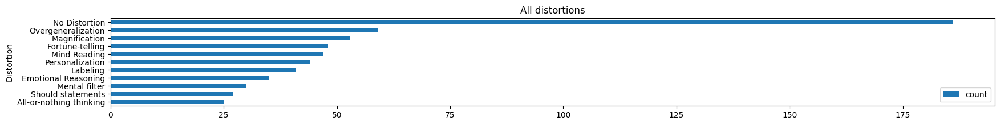

In [3]:
from collections import defaultdict
all_distortions = defaultdict(lambda: defaultdict(int))  # A separate dictionary is created for each distortion (distortion-token-token_frequency)

# Loop through the rows of the DataFrame
for _, row in held_df.iterrows():
    # Text definition: first, check the 2nd column; if NaN, take the text from the 1st column.
    text = row.iloc[1] if pd.notna(row.iloc[1]) else row.iloc[0]
    primary_distortion = row.iloc[2]  # The main cognitive distortion from the 3rd column
    secondary_distortion = row.iloc[3] if pd.notna(row.iloc[3]) else None  # The secondary distortion from the 4th column, if it exists

    dictcount(all_distortions,primary_distortion)
    if secondary_distortion:
        dictcount(all_distortions,secondary_distortion)

print(all_distortions)
plot_dict(
            all_distortions,
            labels="Distortion",
            values="count",
            title=f"All distortions",
            head=20             # All
    )

In [4]:
#Paper Section: "Experimental Setup"

model_multiclass_path = f'../../data/models/distortions/shreevastava2021-t'
model_name = 'multiclass'
rescale = False
inclusion_thresholds = [0,10,20,30,40,50,60,70,80,90]
detection_thresholds = [10,20,30,40,50,60,70,80,90]
selection_metrics = ['F','UF','FN','UFN','TF-IDF','FCR','CFR','MR','NLMI']
n_max_values = [1,2,3,4,5]
splits = [0,1,2]

if not os.path.exists(model_multiclass_path):
    os.makedirs(model_multiclass_path)
print(model_multiclass_path)

../../data/models/distortions/shreevastava2021-t


# Grid search
## Perform a grid search over all hyper-parameters to determine the best combination for building the model
### Non-Weighted Model and Recognition

In [5]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=False,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements

In [6]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary = sorted(summary, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary[0][:4]
F1 = summary[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary[:20]:
    print(s)


DS=Shreevastava21, NM=1, IT=10, SM=UFN, DT=60, F1=0.4051598949391873

(1, 10, 'UFN', 60, 0.32307549141719993, 0.45832755298651245, 0.4051598949391873, 13.506503571766071)
(3, 20, 'UFN', 70, 0.32278508644837245, 0.4625934746368182, 0.4045780796122613, 13.477908185613574)
(1, 20, 'UFN', 40, 0.392830306947954, 0.41820017595512826, 0.40333680533781674, 2.4567343256896943)
(3, 20, 'FN', 70, 0.3425935745190095, 0.43939793331913146, 0.4031988351162248, 10.020740028468484)
(3, 10, 'UFN', 80, 0.3309160717009362, 0.4727039221310395, 0.39492161961275735, 13.130420258168717)
(2, 50, 'UFN', 50, 0.29587024087024083, 0.451494281264726, 0.392904576161391, 16.46444474960625)
(3, 20, 'FCR', 70, 0.3036085343228201, 0.48934487539750704, 0.39228553762463925, 16.49467517301807)
(2, 50, 'FN', 50, 0.2995371563134721, 0.45766778256017854, 0.39185507784991164, 15.706133339393924)
(3, 10, 'FCR', 80, 0.34221716221716225, 0.4757894736842106, 0.39057614680421704, 14.54489349938178)
(5, 20, 'FN', 70, 0.3286691633175

Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})


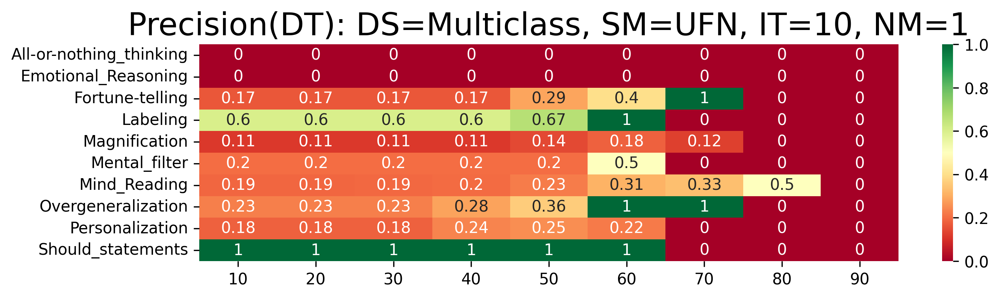

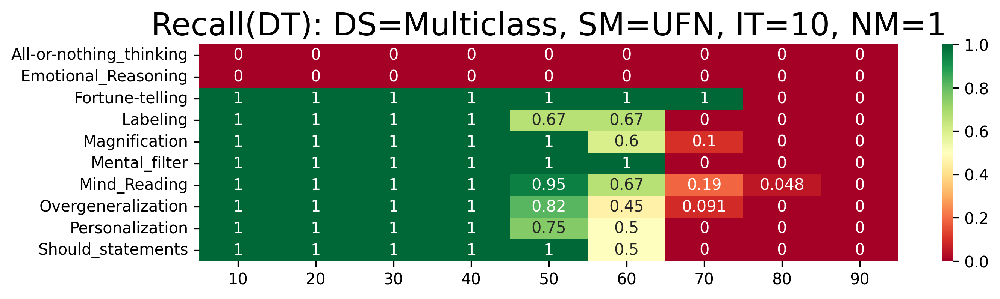

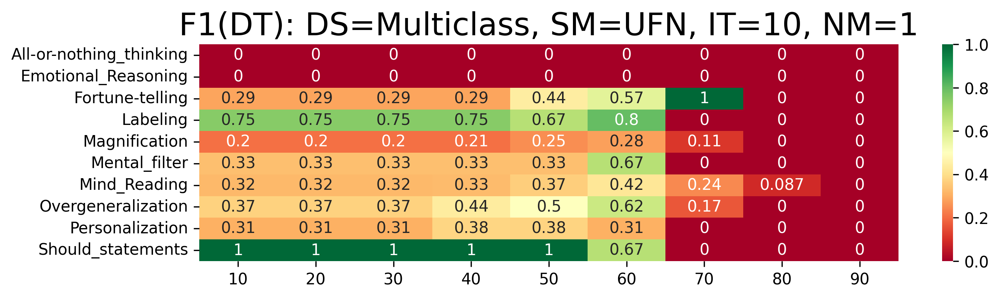

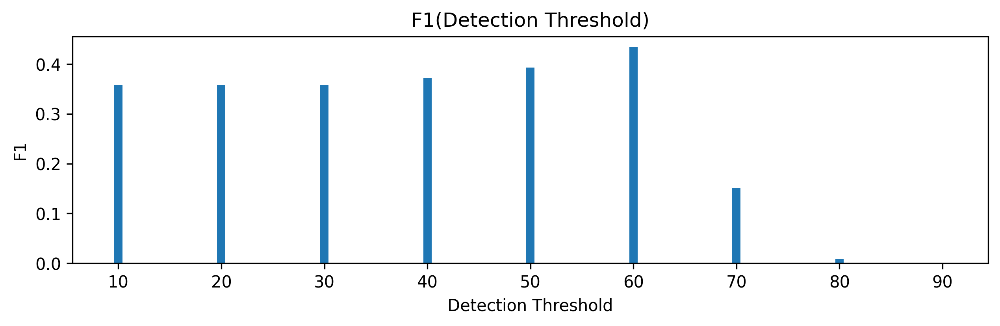

In [7]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=False,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

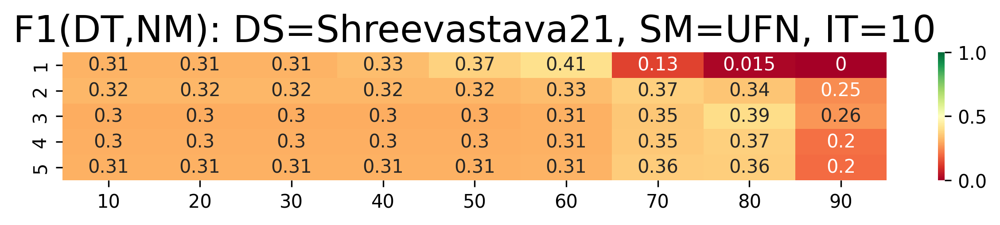

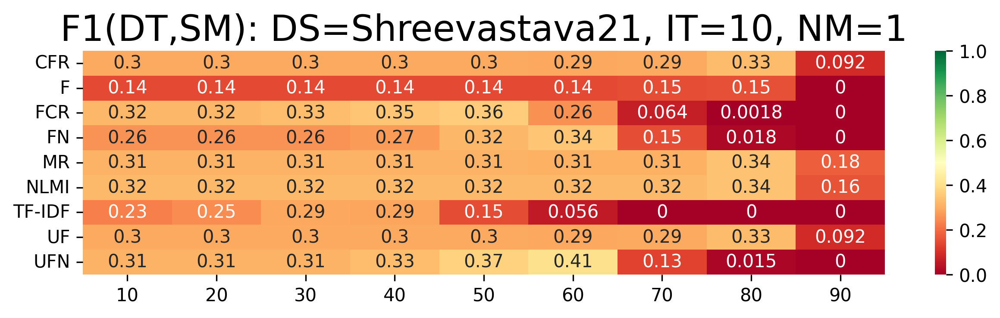

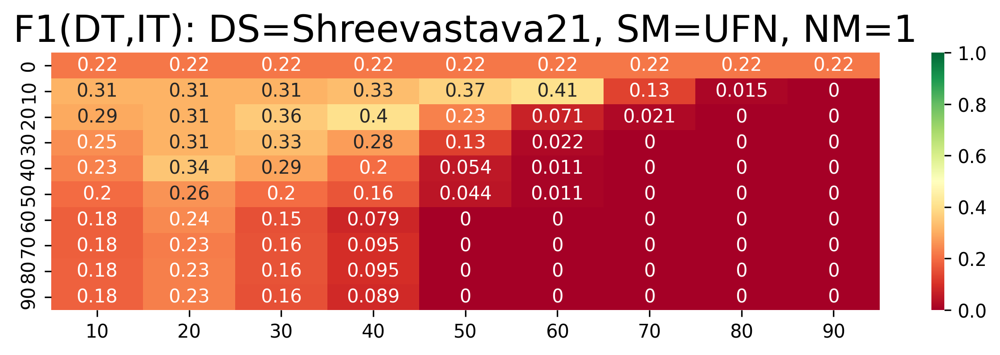

In [8]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


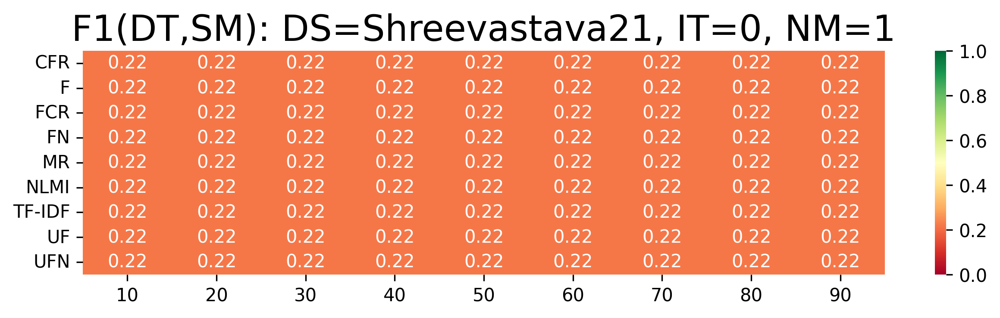

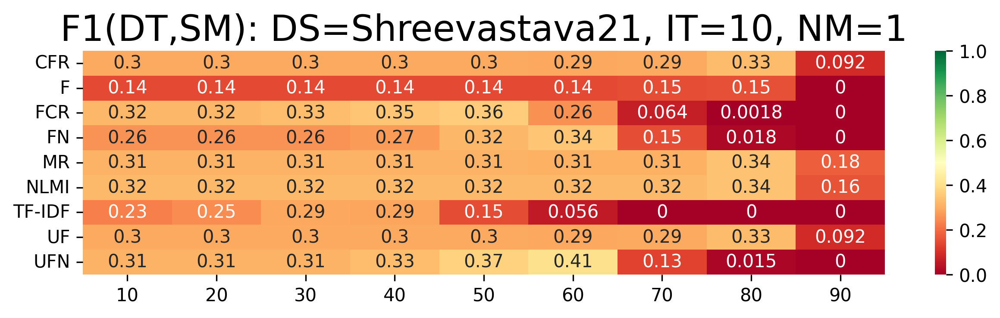

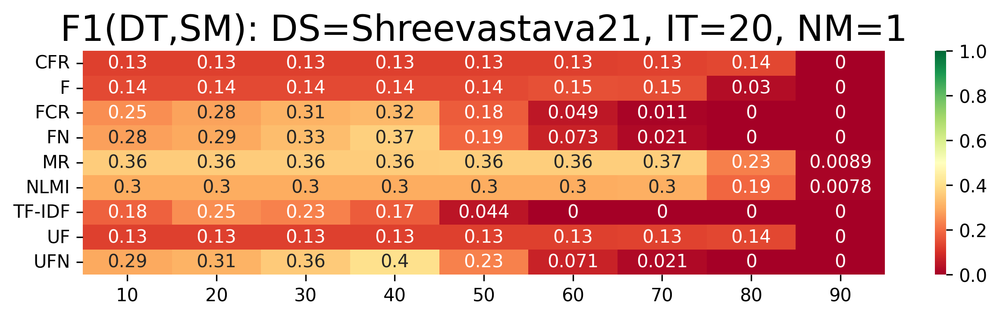

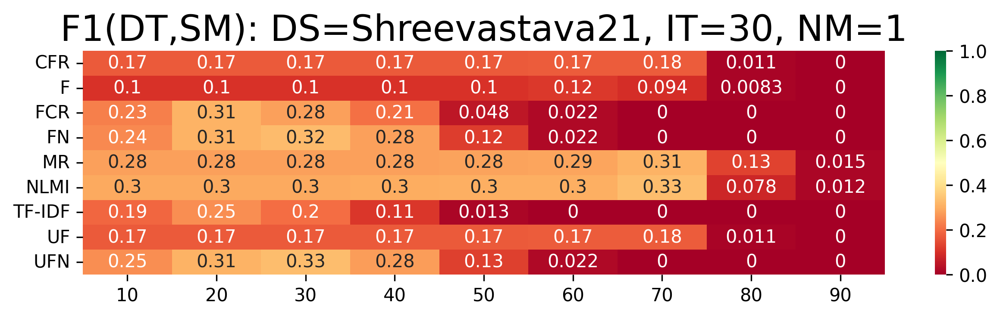

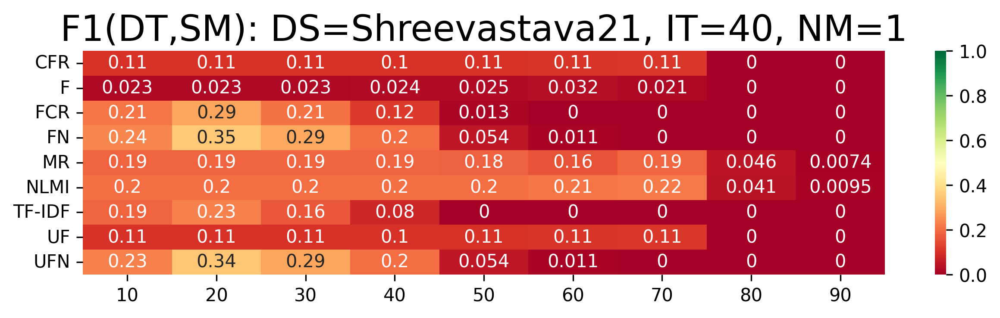

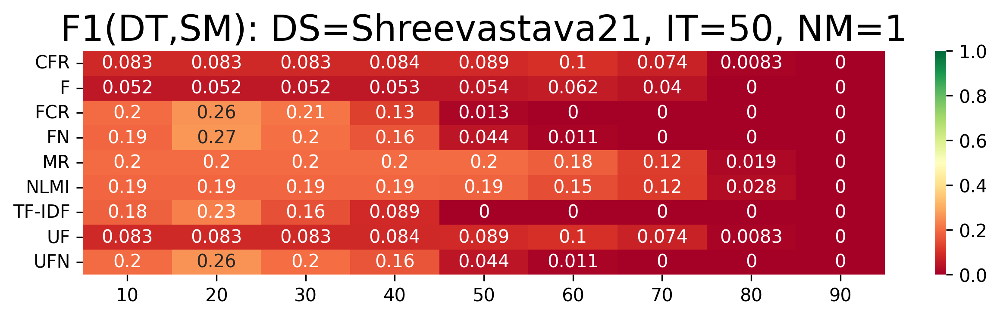

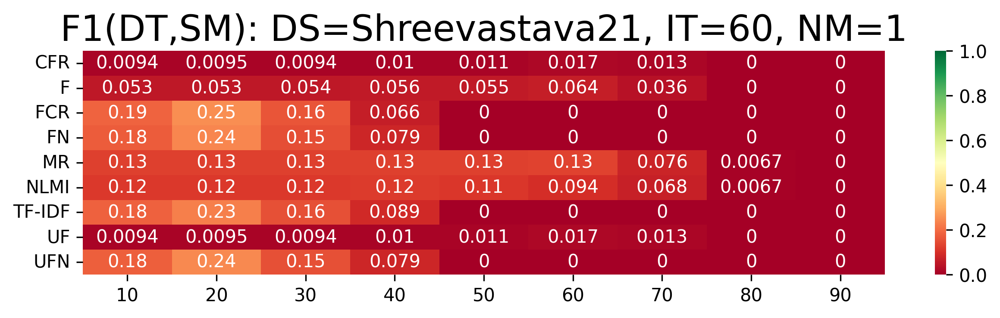

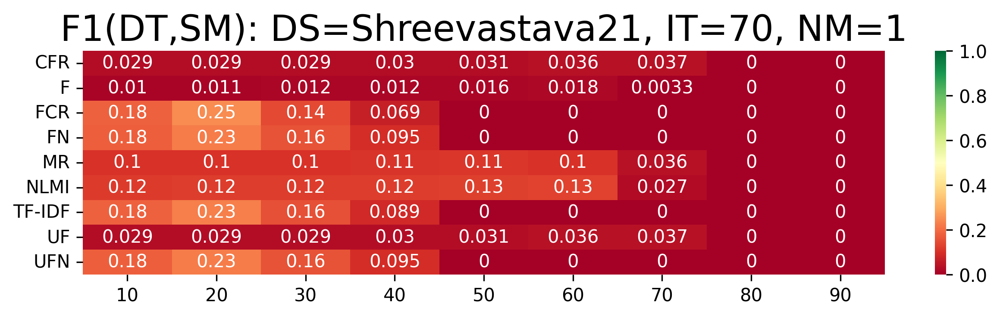

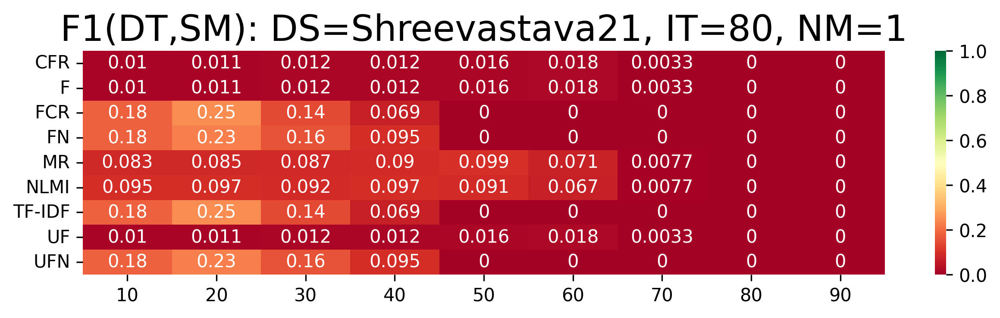

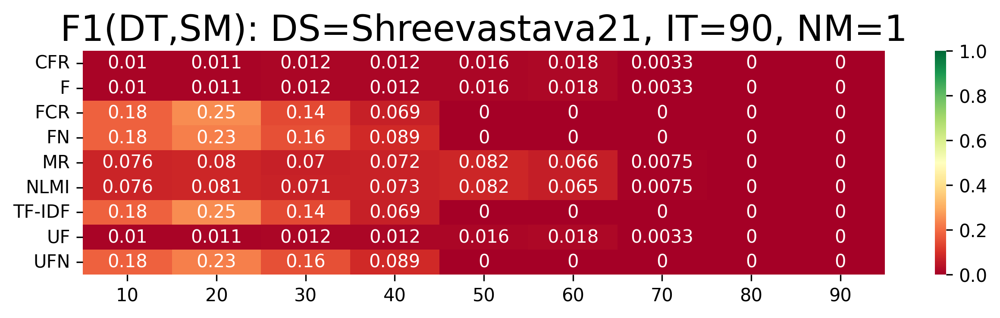

In [9]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


### Weighted Model and Recognition

In [10]:
# Paper section: "Experimental Setup" 

results1 = []
for shift in splits:
    accumulator = []
    for n_max in n_max_values:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=inclusion_thresholds,
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = selection_metrics,
                weighted=True,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results1.append(accumulator)


Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements

In [11]:
# Search the best hyper-parameters based on three runs with min, max and average F1 and its MPE evaluated  

summary_weighted = []
for l1,l2,l3 in zip(results1[0],results1[1],results1[2]):
    summary_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_weighted = sorted(summary_weighted, key=lambda x: (-x[6],x[2],x[0],-x[1],x[3])) # sort by -F1avg, SM, NM, -IT, RT
NM, IT, SM, DT = summary_weighted[0][:4]
F1 = summary_weighted[0][6]
print(f'DS={DS}, NM={NM}, IT={IT}, SM={SM}, DT={DT}, F1={F1}')
print()
for s in summary_weighted[:20]:
    print(s)

DS=Shreevastava21, NM=2, IT=0, SM=UFN, DT=60, F1=0.43633078533086267

(2, 0, 'UFN', 60, 0.3654892247331181, 0.4829961001642037, 0.43633078533086267, 10.82383105958271)
(4, 10, 'UFN', 60, 0.34442655807549427, 0.5090367838193924, 0.41729207356092185, 14.65715359757111)
(4, 0, 'FCR', 60, 0.34558851674641144, 0.5087777777777778, 0.4158707094037331, 14.893582111493716)
(2, 0, 'FCR', 50, 0.3851081717535499, 0.45074331051958705, 0.41555071129981386, 5.645937348968897)
(2, 0, 'FN', 60, 0.36188926557583223, 0.4561503013115916, 0.4138710689565775, 8.373268437084064)
(4, 0, 'F', 10, 0.38189559020693586, 0.4508457556935818, 0.41022199931735265, 6.601914157672489)
(4, 0, 'F', 20, 0.38189559020693586, 0.4508457556935818, 0.41022199931735265, 6.601914157672489)
(4, 0, 'F', 30, 0.38189559020693586, 0.4508457556935818, 0.41022199931735265, 6.601914157672489)
(4, 0, 'F', 40, 0.38189559020693586, 0.4508457556935818, 0.41022199931735265, 6.601914157672489)
(4, 0, 'F', 50, 0.38189559020693586, 0.4508457556

Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})


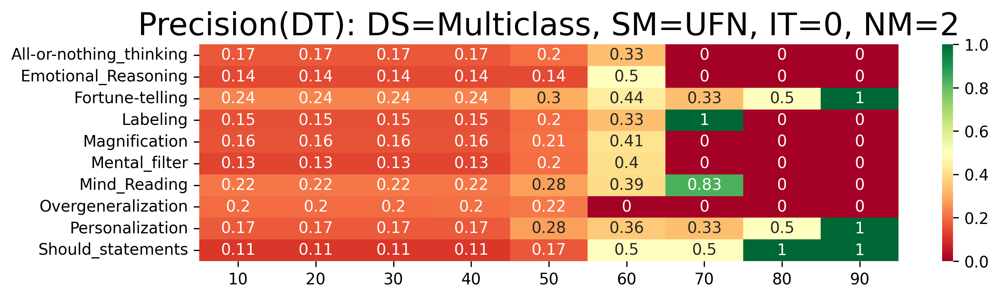

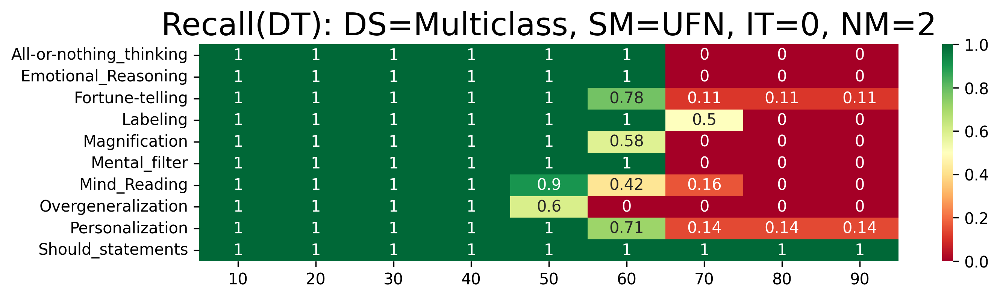

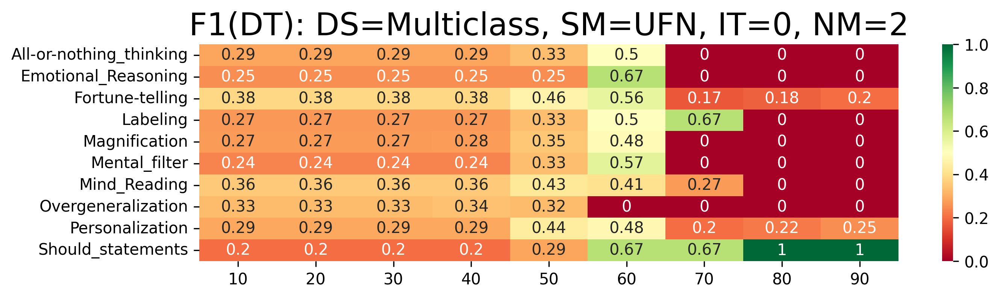

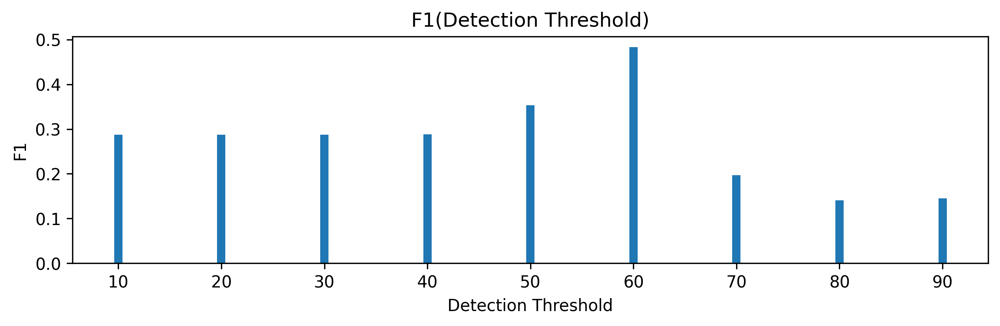

In [12]:
# Explore precison, recall and F1 for specific distortions with best NM, SM, and IT for range of DT 

shift = 0
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True,all_scores=True,averages=True,split_shift=shift,evaluator=our_evaluator_top1)

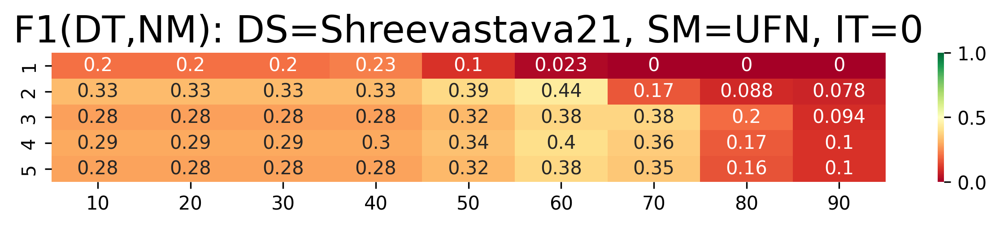

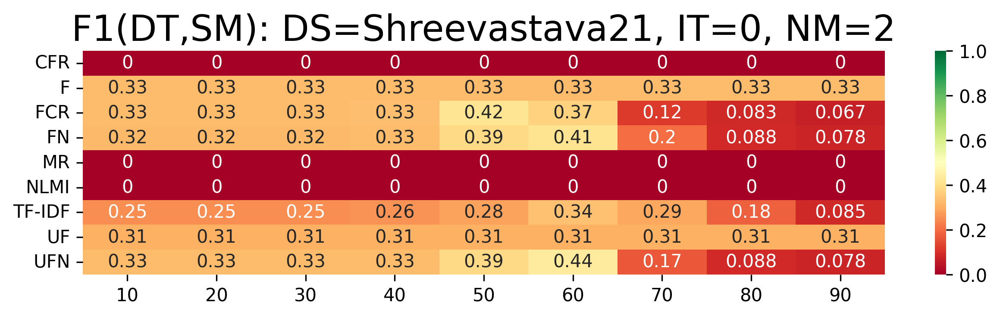

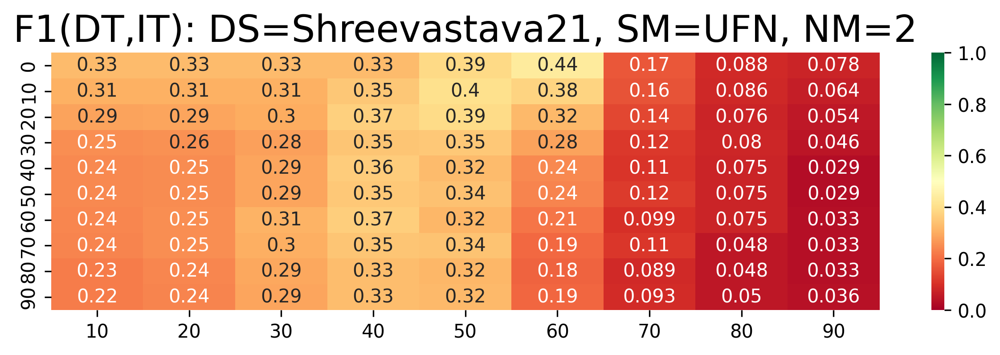

In [13]:
# Render average F1 scores for ranges of NM, SM, and IT and range of DT 

m = build_triple_matrix(summary_weighted,0,3,{2:SM,1:IT},6,n_max_values,detection_thresholds)
matrix_plot(n_max_values, detection_thresholds, m, 1.0, title = f'F1(DT,NM): DS={DS}, SM={SM}, IT={IT}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:IT},6,selection_metrics,detection_thresholds)
matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={IT}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)

m = build_triple_matrix(summary_weighted,1,3,{0:NM,2:SM},6,inclusion_thresholds, detection_thresholds)
matrix_plot(sorted(inclusion_thresholds), detection_thresholds, m, 1.0, title = f'F1(DT,IT): DS={DS}, SM={SM}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


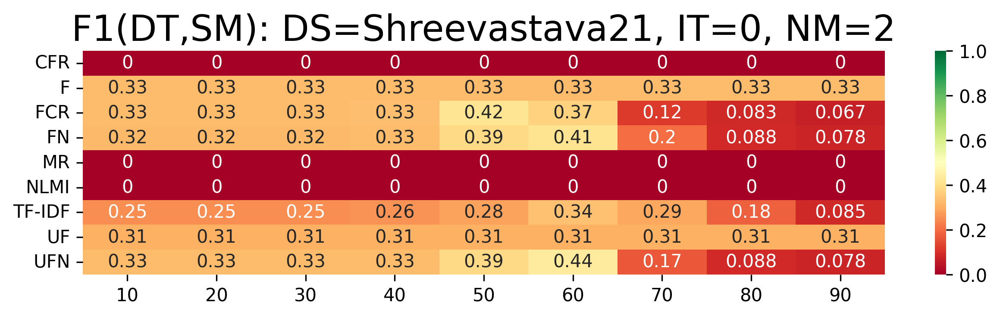

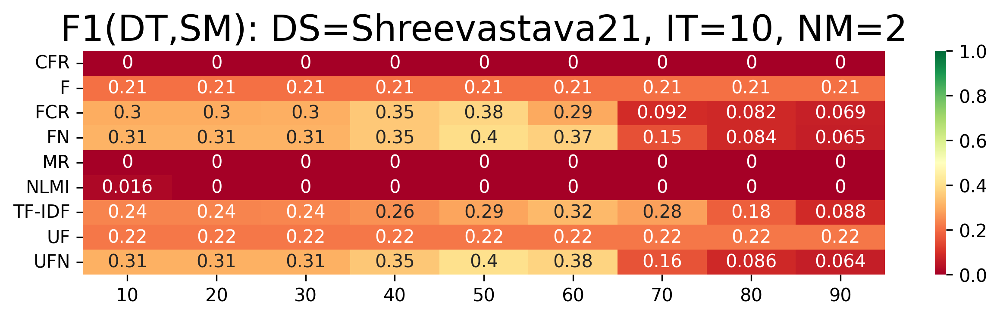

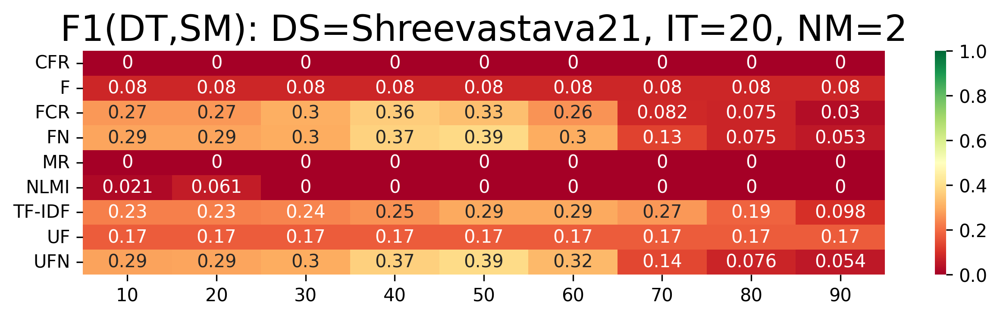

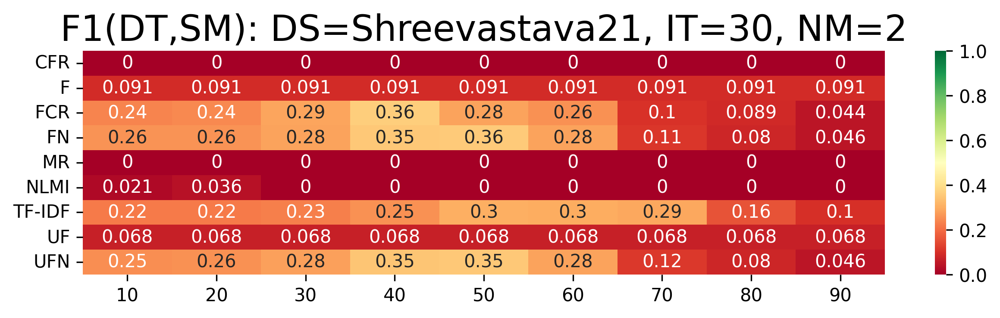

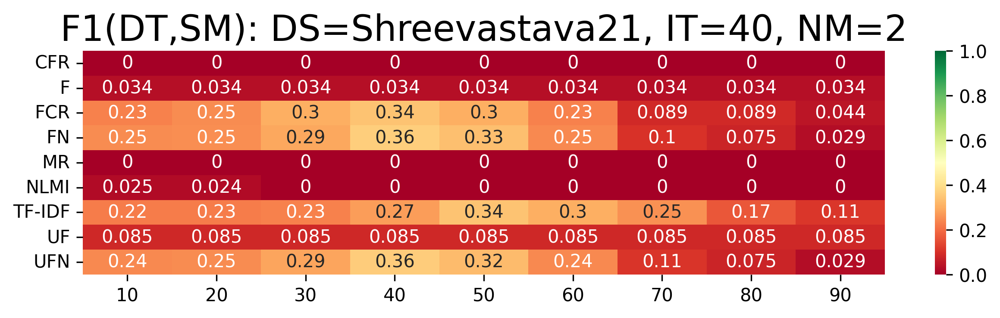

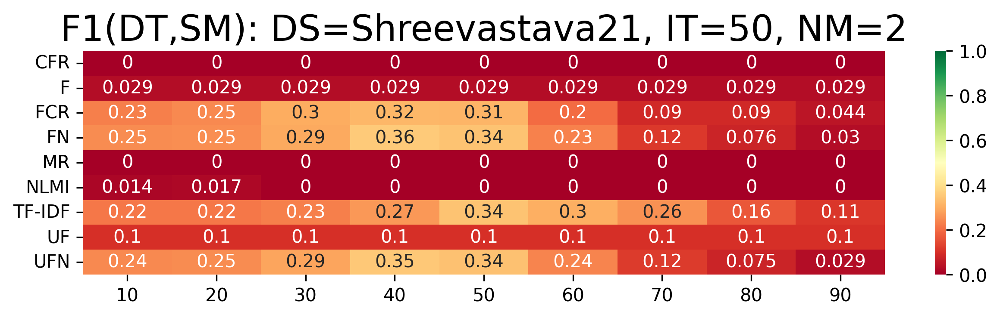

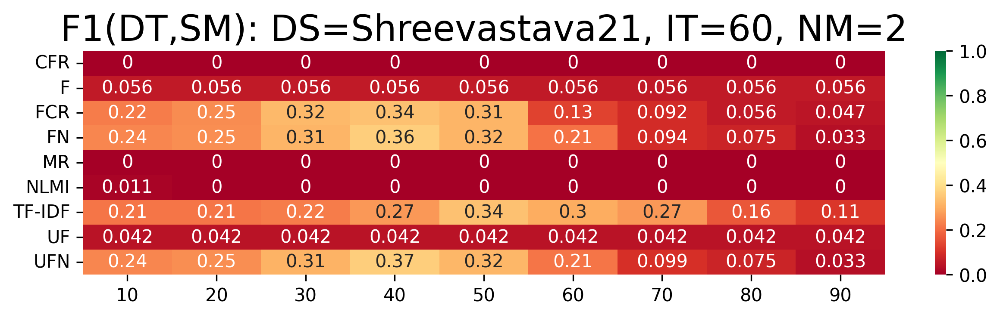

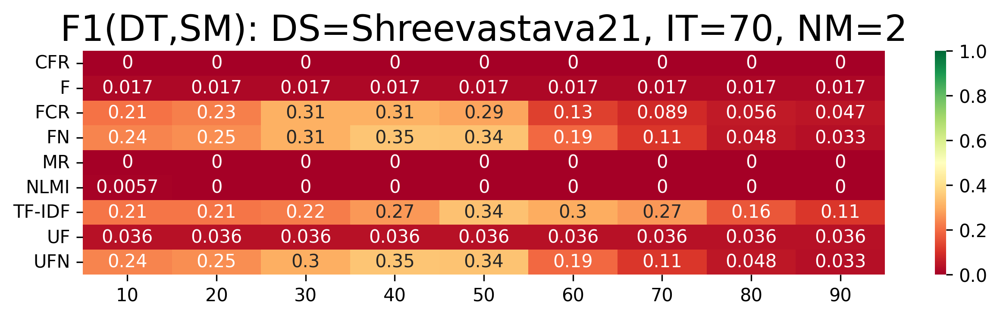

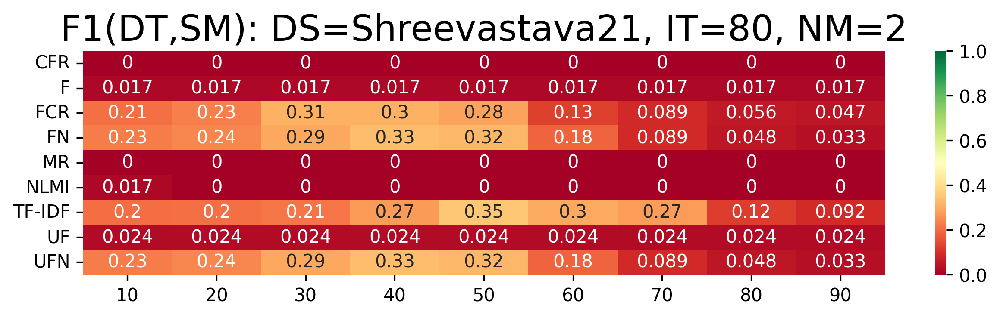

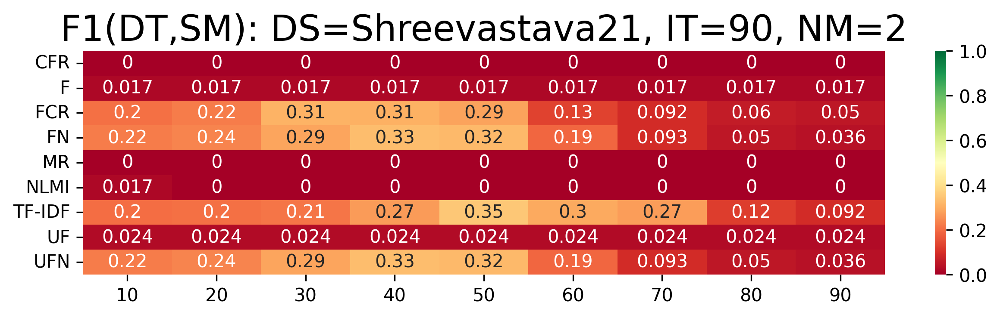

In [14]:
# Visualize how different SM perform with different IT and DT

for it in inclusion_thresholds:
    m = build_triple_matrix(summary_weighted,2,3,{0:NM,1:it},6,selection_metrics,detection_thresholds)
    matrix_plot(sorted(selection_metrics), detection_thresholds, m, 1.0, title = f'F1(DT,SM): DS={DS}, IT={it}, NM={NM}', vmin = 0, vmax = 1.0, titlefontsize = 20, dpi = 300, width = 10)


## Summary

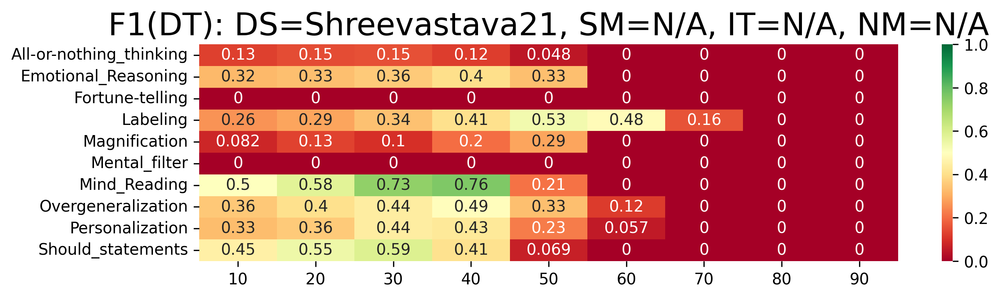

('N/A', 'N/A', 'N/A', 40, 0.3214440736730716, {'All-or-nothing_thinking': 0.12121212121212122, 'Emotional_Reasoning': 0.4, 'Fortune-telling': 0, 'Labeling': 0.40579710144927533, 'Magnification': 0.2, 'Mental_filter': 0, 'Mind_Reading': 0.7586206896551724, 'Overgeneralization': 0.4927536231884058, 'Personalization': 0.42696629213483145, 'Should_statements': 0.409090909090909})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.12, 0.4, 0, 0.41, 0.2, 0, 0.76, 0.49, 0.43, 0.41]


In [15]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)

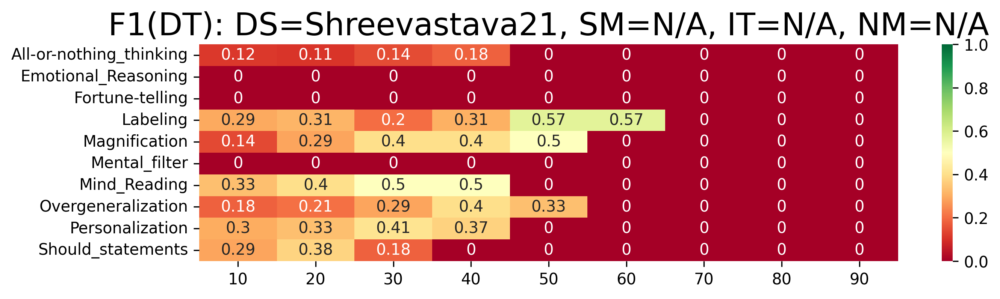

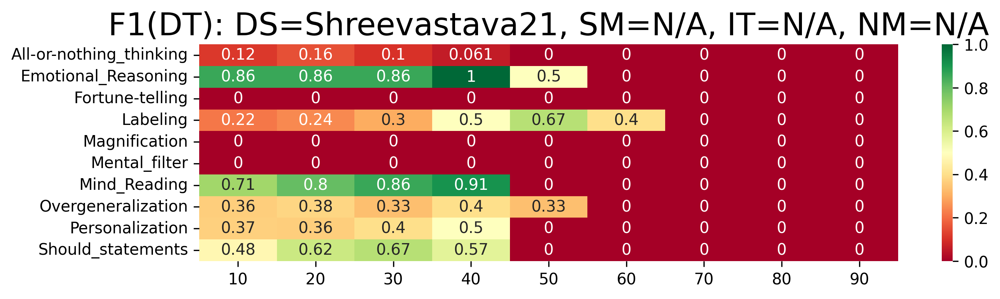

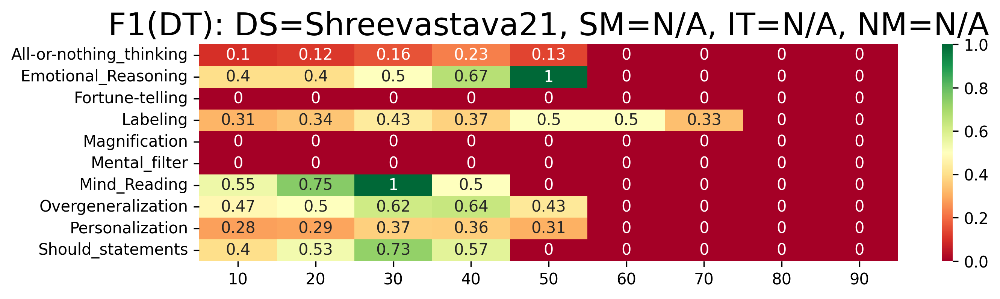

In [16]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % validation_fraction == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

In [17]:
# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

('N/A',
 'N/A',
 'N/A',
 30,
 0.21262531072126273,
 0.3809365361511164,
 0.31511174862905245,
 21.682559357365452)

In [37]:
# Enter baseline F1 performance from the paper (Babacan, O˘guz, and Beyito˘glu 2025)
# https://dergipark.org.tr/tr/download/article-file/3865878, page 7

base_babakan = {'Mind_Reading': 0.6415,
'Should_statements': 0.4615,
'All-or-nothing_thinking': 0.2041,
'Overgeneralization': 0.4928,
'Mental_filter': 0.0000,
'Magnification': 0.0000,
'Emotional_Reasoning': 0.1250,
'Personalization': 0.3913,
'Fortune-telling': 0.4348,
'Labeling': 0.5000}
numbers_babakan = [round(base_babakan[label],2) for label in labels]
print(numbers_babakan)
print(sum(numbers_babakan)/len(numbers_babakan))

[0.2, 0.12, 0.43, 0.5, 0.0, 0.0, 0.64, 0.49, 0.39, 0.46]
0.323


2 0 UFN 60
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})


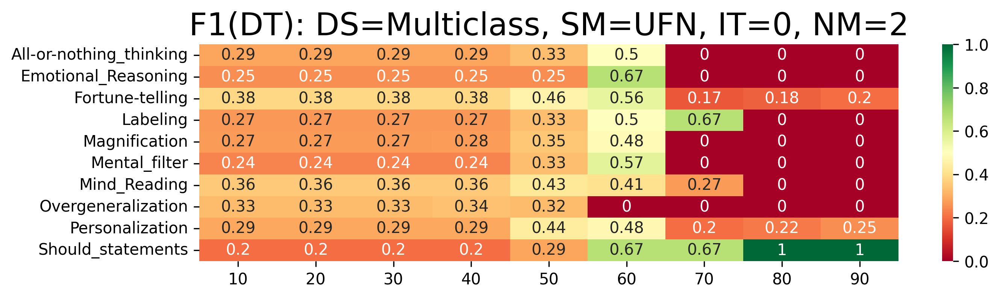

(2, 0, 'UFN', 60, 0.4829961001642037, {'All-or-nothing_thinking': 0.5, 'Emotional_Reasoning': 0.6666666666666666, 'Fortune-telling': 0.56, 'Labeling': 0.5, 'Magnification': 0.4827586206896552, 'Mental_filter': 0.5714285714285715, 'Mind_Reading': 0.40625, 'Overgeneralization': 0, 'Personalization': 0.4761904761904762, 'Should_statements': 0.6666666666666666})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.5, 0.67, 0.56, 0.5, 0.48, 0.57, 0.41, 0, 0.48, 0.67]


In [19]:
# Re-compute distiortion-specific F1 performances

print(NM,IT,SM,DT) # 2 10 FCR 70
shift = 0

accumulator = []
full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=NM, selection_metrics = [SM],
                weighted=True, f1_score=True, split_shift=shift, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_ours = [round(best[5][label],2) for label in labels]
print(numbers_ours)

In [20]:
# Visualize distiortion-specific F1 performances

metric_names = labels
model_metrics = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}
fig = go.Figure()
for i in range(len(labels)):
    fig.add_trace(go.Bar(
        name=metric_names[i],
        x=list(model_metrics), y=[model_metrics[m][i] for m in model_metrics],
    ))
fig.update_layout(
    barmode='group', # Group bars by model
    title='F1 by model and label', # Add a title
    xaxis_title='Model', # Label the x-axis
    yaxis_title='F1', # Label the y-axis
    hovermode='closest' # Improve hover behavior
)
fig.show()

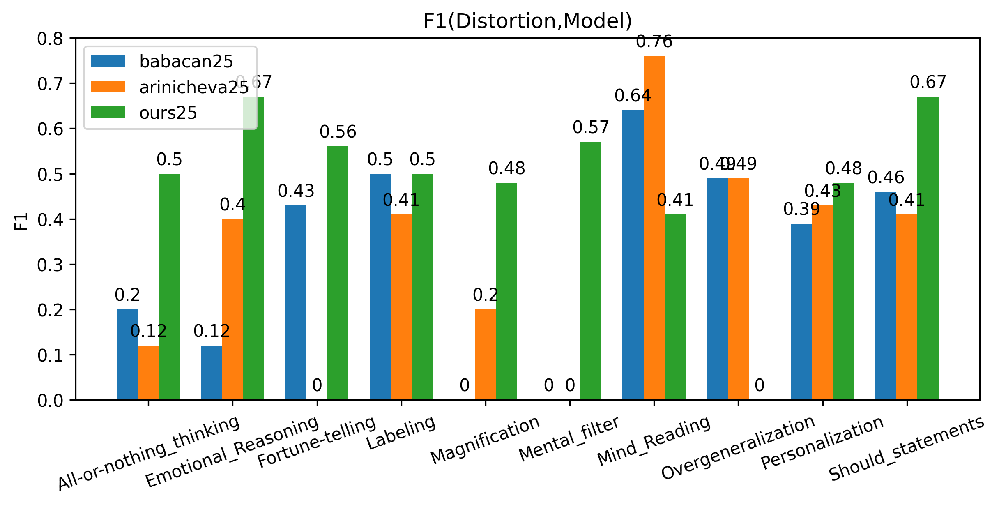

In [21]:
# Visualize distiortion-specific F1 performances

# Paper Figure 4

values = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours25': numbers_ours
}

plt.rcParams["figure.figsize"] = (8,4)

x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in values.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1')
ax.set_title('F1(Distortion,Model)')
ax.set_xticks(x + width, labels)
ax.legend(loc='upper left')#, ncols=3)
ax.set_ylim(0, 0.8)
ax.tick_params(axis='x', rotation=20)
fig.set_dpi(300)

plt.show()

F1 babacan25: 0.323
F1 arinicheva25: 0.31511174862905245%
F1 ours25: 0.4051598949391873%
F1 ours25-weighted: 0.43633078533086267%
MPE arinicheva25: 21.682559357365452%
MPE ours25: 13.506503571766071%
MPE ours25-weighted: 10.82383105958271%


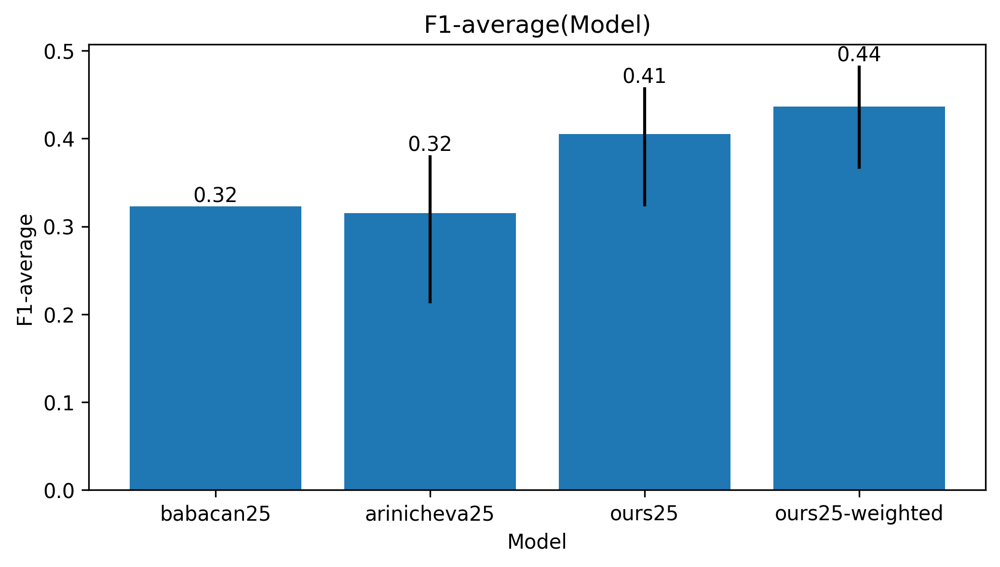

In [22]:
# Visualize grand baseline and our peformances, refering to papers 
# (Arinicheva and Kolonin 2025; Babacan, O˘guz, and Beyito˘glu 2025) 

# Paper Figure 2

# https://dergipark.org.tr/tr/download/article-file/3865878, page 7
f1_babakan = sum(numbers_babakan)/len(numbers_babakan)
print(f'F1 babacan25: {f1_babakan}')
print(f'F1 arinicheva25: {summary_base[0][6]}%')
print(f'F1 ours25: {summary[0][6]}%')
print(f'F1 ours25-weighted: {summary_weighted[0][6]}%')
print(f'MPE arinicheva25: {summary_base[0][7]}%')
print(f'MPE ours25: {summary[0][7]}%')
print(f'MPE ours25-weighted: {summary_weighted[0][7]}%')
plot_bar_from_list_minmax('Model',['babacan25','arinicheva25','ours25','ours25-weighted'],
                          'F1-average',[f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5])])

# Illustrate Explainabillity-Intepretability Markup

In [23]:
#https://stackoverflow.com/questions/35731194/how-to-highlight-a-word-found-in-a-text-file
def get_fragment_indexes(text,ngrams):
    text = text.lower()
    pats = [' '.join(ngram) for ngram in ngrams]
    minpos = len(text)
    maxpos = 0
    for pat in pats:
        startpos = text.find(pat)
        if startpos > -1:
            endpos = startpos + len(pat)
            if minpos > startpos:
                minpos = startpos
            if maxpos < endpos:
                maxpos = endpos
    return minpos, maxpos


def highlight_text_console(text,ngrams,backcolor,fontcolor):
    minpos, maxpos = get_fragment_indexes(text,ngrams)
    if minpos < maxpos:
        return text[0:minpos]+f'\033[4{backcolor};3{fontcolor}m'+text[minpos:maxpos]+'\033[m'+text[maxpos:len(text)]
    return text


In [24]:
# Paper section: "Methodology"
# Paper sub-section: "Interpretability"
# Paper Figure 1

explanation = {}
text = "Whatever happens, I feel like she does not believe my words and actions."
distortions = tm_base.get_sentiment_words(text,explanation)
distortion = sorted([(d,distortions[d]) for d in distortions],key=lambda x:-x[1])[0]
print(f'Distortion: {distortion[0]}, confidence: {distortion[1]}')
print(f'Speech patterns: {explanation[distortion[0]]}')
print(highlight_text_console(text,explanation[distortion[0]],3,0)) 

Distortion: Mind_Reading, confidence: 0.72
Speech patterns: [('she', 'does', 'not', 'believe')]
Whatever happens, I feel like she does not believe my words and actions.


## Re-evaluate models on 20% withheld dataset (held_df)

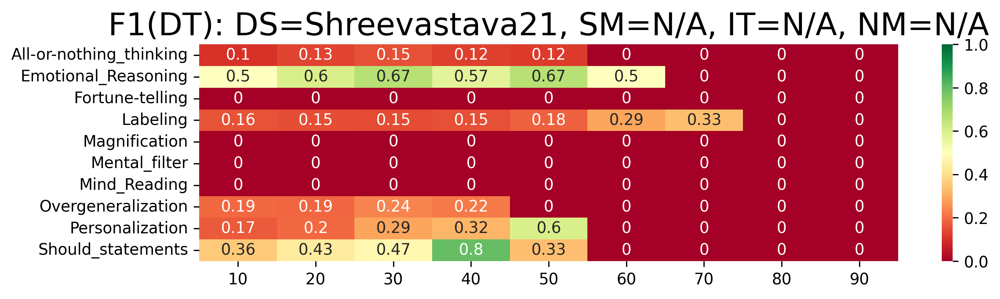

('N/A', 'N/A', 'N/A', 40, 0.21882864211811587, {'All-or-nothing_thinking': 0.125, 'Emotional_Reasoning': 0.5714285714285715, 'Fortune-telling': 0, 'Labeling': 0.15384615384615383, 'Magnification': 0, 'Mental_filter': 0, 'Mind_Reading': 0, 'Overgeneralization': 0.2222222222222222, 'Personalization': 0.31578947368421056, 'Should_statements': 0.8000000000000002})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.12, 0.57, 0, 0.15, 0, 0, 0, 0.22, 0.32, 0.8]


In [25]:
# Paper section: "Results and Discussion"

# Evaluate baseline model (Arinicheva and Kolonin 2025) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_base = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_base, held_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_arinicheva = [round(best[5][label],2) for label in labels]
print(numbers_arinicheva)


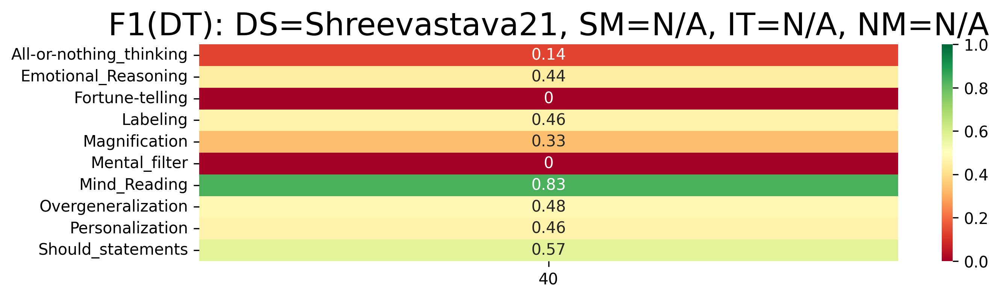

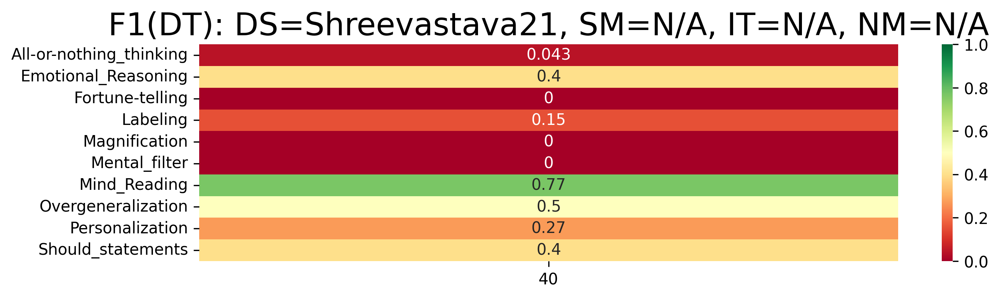

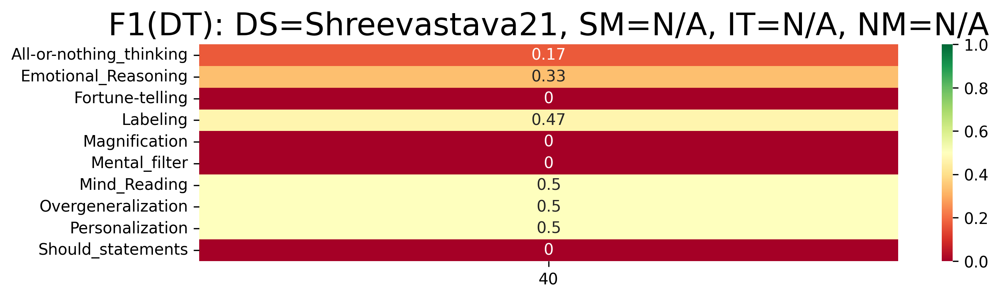

('N/A',
 'N/A',
 'N/A',
 40,
 0.2469491525423729,
 0.37130046977504605,
 0.2906951203489249,
 18.48565588335747)

In [26]:
# Evaluate baseline model (Arinicheva and Kolonin 2025) within 3 splits

detection_thresholds = [40] # based on the above

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % 3 == 0]
    accumulator_base = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_base = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_base.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_base = sorted(summary_base, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_base[0]

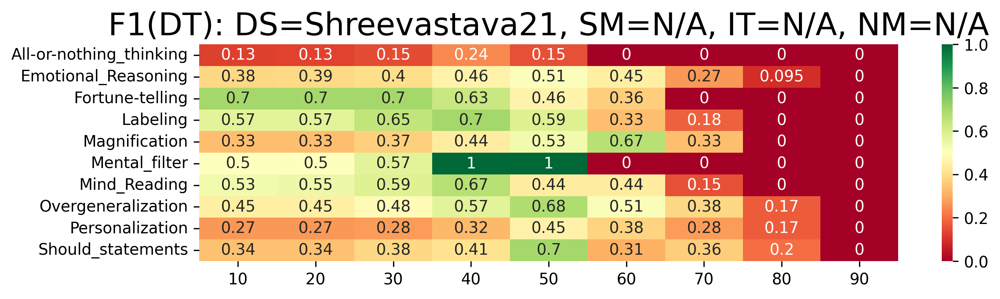

('N/A', 'N/A', 'N/A', 50, 0.5523518592379669, {'All-or-nothing_thinking': 0.15384615384615383, 'Emotional_Reasoning': 0.5079365079365079, 'Fortune-telling': 0.4615384615384615, 'Labeling': 0.588235294117647, 'Magnification': 0.5333333333333333, 'Mental_filter': 1.0, 'Mind_Reading': 0.4444444444444445, 'Overgeneralization': 0.6808510638297872, 'Personalization': 0.4533333333333333, 'Should_statements': 0.7000000000000001})
['All-or-nothing_thinking', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.15, 0.51, 0.46, 0.59, 0.53, 1.0, 0.44, 0.68, 0.45, 0.7]
0.551


In [27]:
# Evaluate joint model (ours 2026) without splits

all_metricsmap = {'All-or-nothing_thinking':'dichotomous-reasoning',
              'Fortune-telling':'fortune-telling',
              'Mental_filter':'mental-filtering',
              'Overgeneralization':'overgeneralizing',
              'Labeling':'labeling',
              'Mind_Reading':'mindreading',
              'Personalization':'personalizing',
              'Emotional_Reasoning':'emotional-reasoning',
              'Magnification':'magnification',
              'Should_statements':'should-statement'}

def language_metrics(lang,metrics_filenames,path):
    metrics = {}
    for m in metrics_filenames:
        filename = metrics_filenames[m] if type(metrics_filenames) == dict else m
        metrics[m] = path + lang + '/' + filename + '.txt'
    return metrics

tm_26 = TextMetrics(language_metrics('',all_metricsmap,path='../../data/models/distortions/ours26')
                  ,encoding="utf-8",metric_logarithmic=True,debug=False)

detection_thresholds = [10,20,30,40,50,60,70,80,90]

accumulator = []
evaluate_metrics(tm_26, held_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator)

best = sorted(accumulator, key=lambda x: (-x[4]))[0]
print(best)
labels = sorted(list(best[5]))
print(labels)
numbers_joint = [round(best[5][label],2) for label in labels]
print(numbers_joint)
print(sum(numbers_joint)/len(numbers_joint))

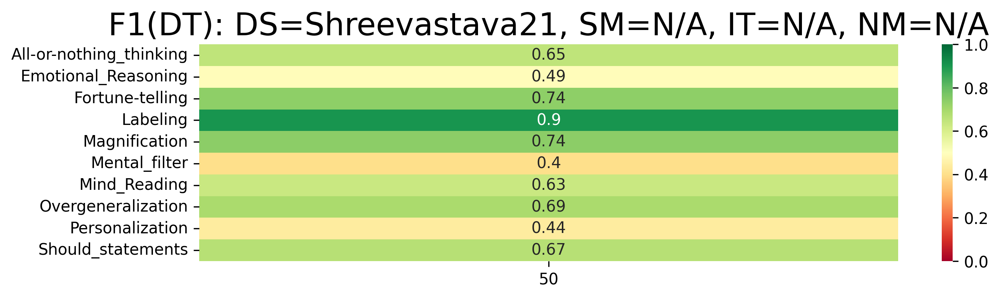

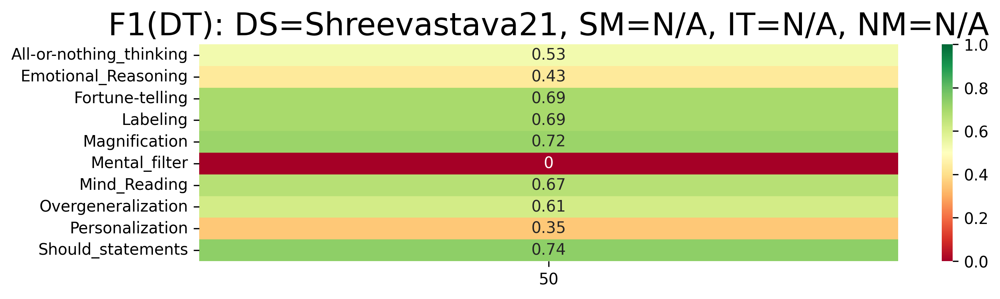

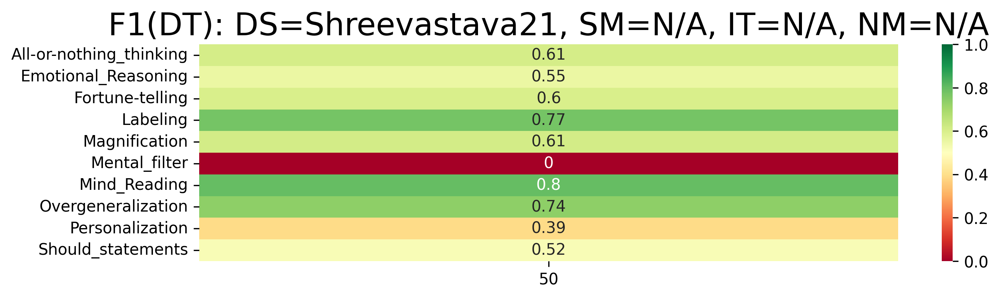

('N/A',
 'N/A',
 'N/A',
 50,
 0.5433243089469019,
 0.634834199645985,
 0.5791695107799134,
 6.407414735525128)

In [28]:
# Evaluate joint model (ours 2026) with splits

detection_thresholds = [50] # based on the above

results_base = []
for shift in splits:
    test_df  = df[(df.index + shift) % 3 == 0]
    accumulator_base = []
    evaluate_metrics(tm_26, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1, accumulator=accumulator_base)
    results_base.append(accumulator_base)

# Print F1 performance of baseline model (Arinicheva and Kolonin 2025) within 3 splits

summary_cleaned = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_cleaned.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_cleaned = sorted(summary_cleaned, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_cleaned[0]

## Create Final Models with all Inclusion Thresholds

Creating final model for 1 10 UFN 60
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=1: train=1620, test=404
Labels count: defaultdict(<class 'int'>, {'Labeling': 126, 'Emotional_Reasoning': 113, 'No_Distortion': 595, 'Fortune-telling': 133, 'Magnification': 152, 'Mind_Reading': 202, 'Personalization': 122, 'All-or-nothing_thinking': 86, 'Mental_filter': 96, 'Overgeneralization': 170, 'Should_statements': 87})
Shift=2: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'Labeling': 129, 'Emotional_Reasoning': 107, 'No_Distortion': 599, 'Magnification': 152, 'Fortune-telling': 120, 'Personalization': 127, 'Mind_Reading': 206, 'Overgeneralization': 176, 'All-or-nothing_thinking': 75, 'Men

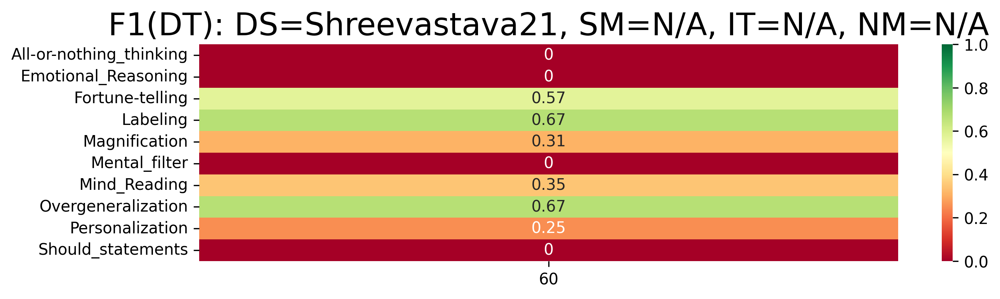

('N/A', 'N/A', 'N/A', 60, 0.28124121215696685, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 0.5714285714285715, 'Labeling': 0.6666666666666666, 'Magnification': 0.3103448275862069, 'Mental_filter': 0, 'Mind_Reading': 0.3473053892215569, 'Overgeneralization': 0.6666666666666666, 'Personalization': 0.25, 'Should_statements': 0, 'Distortion': 0.7748184019370461})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.77, 0, 0.57, 0.67, 0.31, 0, 0.35, 0.67, 0.25, 0]


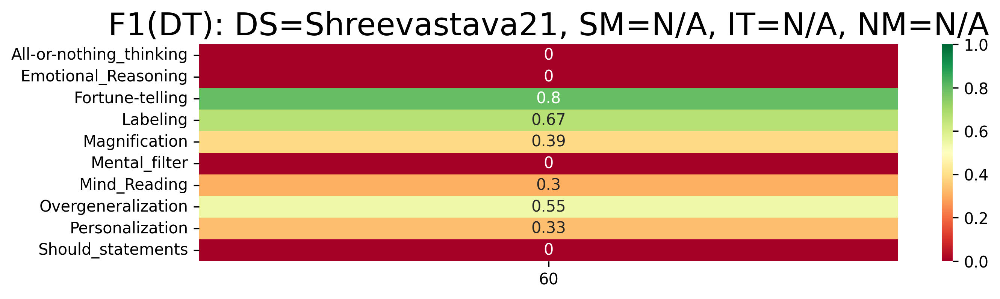

('N/A', 'N/A', 'N/A', 60, 0.3037914862914863, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 0.8000000000000002, 'Labeling': 0.6666666666666666, 'Magnification': 0.38888888888888895, 'Mental_filter': 0, 'Mind_Reading': 0.30357142857142855, 'Overgeneralization': 0.5454545454545455, 'Personalization': 0.33333333333333337, 'Should_statements': 0, 'Distortion': 0.7748184019370461})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.77, 0, 0.8, 0.67, 0.39, 0, 0.3, 0.55, 0.33, 0]


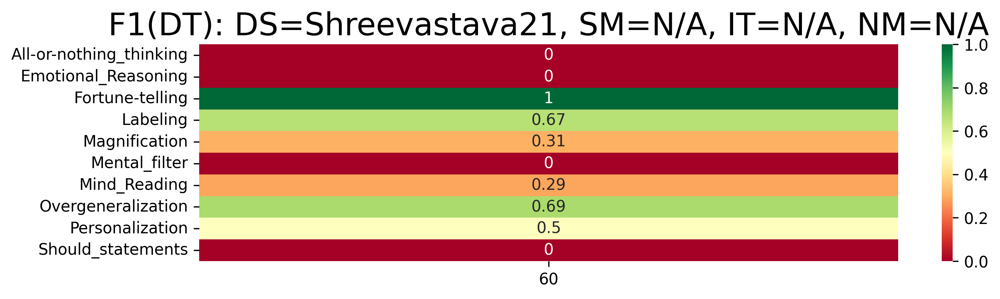

('N/A', 'N/A', 'N/A', 60, 0.34529875308031854, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0, 'Fortune-telling': 1.0, 'Labeling': 0.6666666666666666, 'Magnification': 0.30769230769230765, 'Mental_filter': 0, 'Mind_Reading': 0.2889733840304183, 'Overgeneralization': 0.6896551724137931, 'Personalization': 0.5, 'Should_statements': 0, 'Distortion': 0.7748184019370461})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.77, 0, 1.0, 0.67, 0.31, 0, 0.29, 0.69, 0.5, 0]


('N/A',
 'N/A',
 'N/A',
 60,
 0.28124121215696685,
 0.34529875308031854,
 0.3101104838429239,
 7.564673682604487)

In [29]:
# Paper section: "Conclusion"

NM=1; IT=10; SM='UFN'; DT=60; WT = False # F1 = 0.41 - Unweighted

local_t0 = dt.datetime.now()

print('Creating final model for',NM,IT,SM,DT)

results = []
for shift in splits:
    accumulator = []
    for n_max in [NM]:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = [SM],
                weighted=WT,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results.append(accumulator)

summ = summarize_full_test_circle(results)
print()
for s in summ[:20]:
    print(s) 
    
local_t1 = dt.datetime.now()
local_delta = local_t1 - local_t0 
# time for recognition with multiple thresholds of 3 splits each 1/5 of the number of texts in dataset
print('Time to process single text:',str(local_delta/len(detection_thresholds)/(len(df)*3/5)))

print()

all_metrics = {'All-or-nothing_thinking',
              'Fortune-telling',
              'Mental_filter',
              'Overgeneralization',
              'Labeling',
              'Mind_Reading',
              'Personalization',
              'Emotional_Reasoning',
              'Magnification',
              'Should_statements'}

# Evaluate F1 on withheld test set - weighted

detection_thresholds = [60] # [10,20,30,40,50,60,70,80,90]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/{model_name}-{shift+1}-{IT}')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=WT,debug=False)

    test_df  = held_df #[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_weighted = [round(best[5][label],2) for label in labels]
    print(numbers_weighted)
    results_base.append(accumulator)
    
# Print F1 performance of unweighted

summary_final = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_final.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_final = sorted(summary_final, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_final[0]


Creating final model for 2 0 UFN 60
Shift=0: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'No_Distortion': 591, 'Fortune-telling': 137, 'Emotional_Reasoning': 103, 'Magnification': 158, 'Mind_Reading': 196, 'Personalization': 124, 'All-or-nothing_thinking': 85, 'Overgeneralization': 173, 'Labeling': 119, 'Mental_filter': 103, 'Should_statements': 89})
Shift=1: train=1620, test=404
Labels count: defaultdict(<class 'int'>, {'Labeling': 126, 'Emotional_Reasoning': 113, 'No_Distortion': 595, 'Fortune-telling': 133, 'Magnification': 152, 'Mind_Reading': 202, 'Personalization': 122, 'All-or-nothing_thinking': 86, 'Mental_filter': 96, 'Overgeneralization': 170, 'Should_statements': 87})
Shift=2: train=1619, test=405
Labels count: defaultdict(<class 'int'>, {'Labeling': 129, 'Emotional_Reasoning': 107, 'No_Distortion': 599, 'Magnification': 152, 'Fortune-telling': 120, 'Personalization': 127, 'Mind_Reading': 206, 'Overgeneralization': 176, 'All-or-nothing_thinking': 75, 'Ment

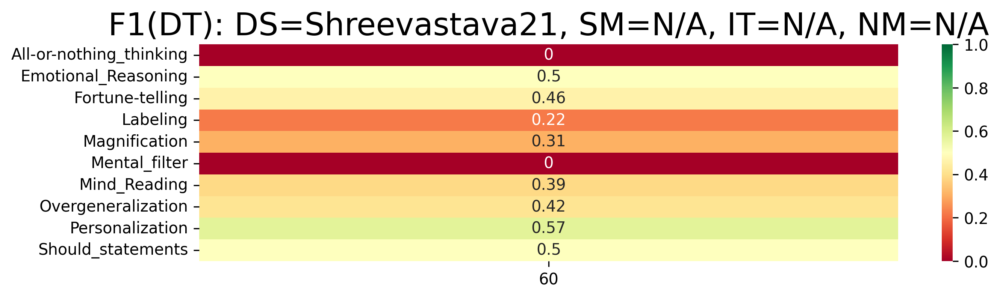

('N/A', 'N/A', 'N/A', 60, 0.33632123266451625, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.5, 'Fortune-telling': 0.45714285714285713, 'Labeling': 0.22222222222222224, 'Magnification': 0.3076923076923077, 'Mental_filter': 0, 'Mind_Reading': 0.38805970149253727, 'Overgeneralization': 0.4166666666666667, 'Personalization': 0.5714285714285714, 'Should_statements': 0.5, 'Distortion': 0.7643467643467643})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.76, 0.5, 0.46, 0.22, 0.31, 0, 0.39, 0.42, 0.57, 0.5]


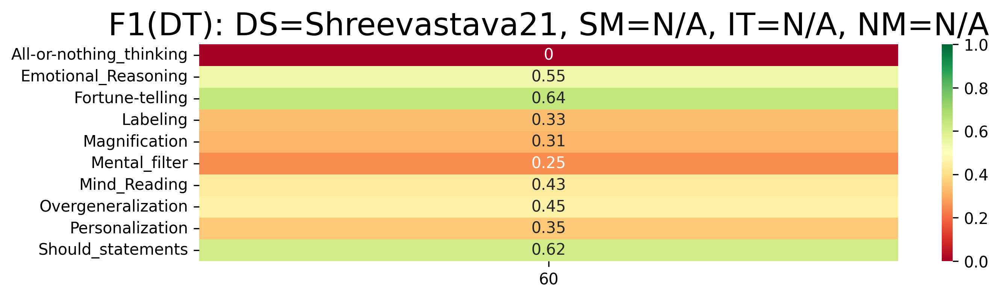

('N/A', 'N/A', 'N/A', 60, 0.3941798876741332, {'All-or-nothing_thinking': 0, 'Emotional_Reasoning': 0.5454545454545454, 'Fortune-telling': 0.6428571428571429, 'Labeling': 0.3333333333333333, 'Magnification': 0.3125, 'Mental_filter': 0.25, 'Mind_Reading': 0.43478260869565216, 'Overgeneralization': 0.4545454545454546, 'Personalization': 0.3529411764705882, 'Should_statements': 0.6153846153846154, 'Distortion': 0.762836185819071})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0, 0.76, 0.55, 0.64, 0.33, 0.31, 0.25, 0.43, 0.45, 0.35, 0.62]


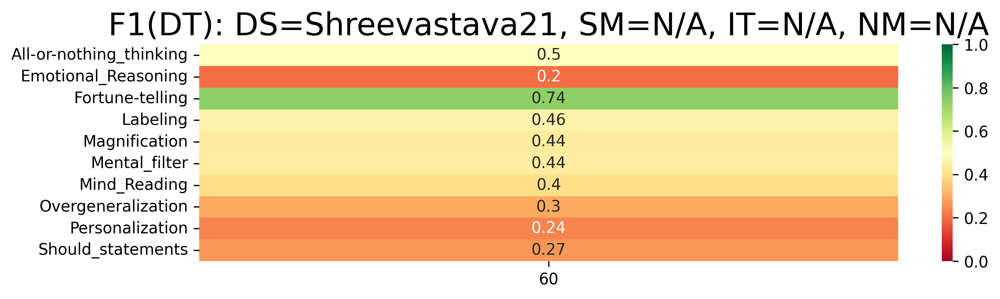

('N/A', 'N/A', 'N/A', 60, 0.39785820918560855, {'All-or-nothing_thinking': 0.5, 'Emotional_Reasoning': 0.20000000000000004, 'Fortune-telling': 0.7368421052631579, 'Labeling': 0.46153846153846156, 'Magnification': 0.43749999999999994, 'Mental_filter': 0.4444444444444445, 'Mind_Reading': 0.4, 'Overgeneralization': 0.2962962962962963, 'Personalization': 0.23529411764705885, 'Should_statements': 0.26666666666666666, 'Distortion': 0.7658536585365855})
['All-or-nothing_thinking', 'Distortion', 'Emotional_Reasoning', 'Fortune-telling', 'Labeling', 'Magnification', 'Mental_filter', 'Mind_Reading', 'Overgeneralization', 'Personalization', 'Should_statements']
[0.5, 0.77, 0.2, 0.74, 0.46, 0.44, 0.44, 0.4, 0.3, 0.24, 0.27]


('N/A',
 'N/A',
 'N/A',
 60,
 0.33632123266451625,
 0.39785820918560855,
 0.376119776508086,
 7.054232247160084)

In [30]:
# Paper section: "Conclusion"

local_t0 = dt.datetime.now()

NM=2; IT=0; SM='UFN'; DT=60; WT = True # F1 = 0.44 - Weighted

print('Creating final model for',NM,IT,SM,DT)

results = []
for shift in splits:
    accumulator = []
    for n_max in [NM]:
        full_test_circle(df,model_multiclass_path,f'{model_name}-{shift+1}-W',
                validation_fraction=validation_fraction,inclusion_thresholds=[IT],
                detection_thresholds=detection_thresholds,n_max=n_max, selection_metrics = [SM],
                weighted=WT,all_scores=False,averages=False,split_shift=shift,
                evaluator=our_evaluator_top1,accumulator=accumulator)
    results.append(accumulator)

summ = summarize_full_test_circle(results)
print()
for s in summ[:20]:
    print(s) 
    
local_t1 = dt.datetime.now()
local_delta = local_t1 - local_t0 
# time for recognition with multiple thresholds of 3 splits each 1/5 of the number of texts in dataset
print('Time to process single text:',str(local_delta/len(detection_thresholds)/(len(df)*3/5)))

print()

all_metrics = {'All-or-nothing_thinking',
              'Fortune-telling',
              'Mental_filter',
              'Overgeneralization',
              'Labeling',
              'Mind_Reading',
              'Personalization',
              'Emotional_Reasoning',
              'Magnification',
              'Should_statements'}

# Evaluate F1 on withheld test set - weighted

detection_thresholds = [60] # [10,20,30,40,50,60,70,80,90]

results_base = []
for shift in splits:
    tm_base = TextMetrics(language_metrics('',all_metrics,path=model_multiclass_path+f'/{model_name}-{shift+1}-W-{IT}')
                      ,encoding="utf-8",metric_logarithmic=True,weighted=WT,debug=False)

    test_df  = held_df #[(held_df.index + shift) % 3 == 0]
    accumulator = []
    evaluate_metrics(tm_base, test_df, 'N/A', detection_thresholds, DS, list(all_metricsmap), n_max='N/A', 
                    selection_metric = 'N/A', f1_score=True, evaluator=our_evaluator_top1,
                    binary='Distortion', accumulator=accumulator)

    best = sorted(accumulator, key=lambda x: (-x[4]))[0]
    print(best)
    labels = sorted(list(best[5]))
    print(labels)
    numbers_weighted = [round(best[5][label],2) for label in labels]
    print(numbers_weighted)
    results_base.append(accumulator)
    
# Print F1 performance of weighted

summary_final_weighted = []
for l1,l2,l3 in zip(results_base[0],results_base[1],results_base[2]):
    summary_final_weighted.append( l1[0:4] + agg_min_max_avg_mpe((l1[4],l2[4],l3[4])))
summary_final_weighted = sorted(summary_final_weighted, key=lambda x: (-x[6],x[3])) # sort by -F1avg, DT
summary_final_weighted[0]

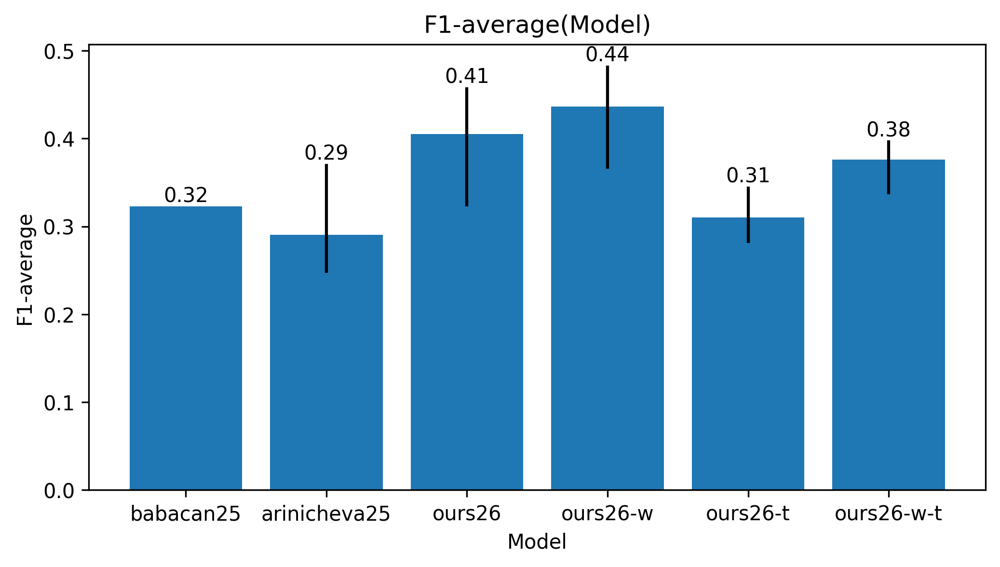

In [31]:
plot_bar_from_list_minmax('Model',
                          ['babacan25','arinicheva25','ours26','ours26-w','ours26-t','ours26-w-t'],
                          'F1-average',
                          [f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6],
                          summary_final[0][6],summary_final_weighted[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5]),
                                 (summary_final[0][4],summary_final[0][5]),
                                  (summary_final_weighted[0][4],summary_final_weighted[0][5])])

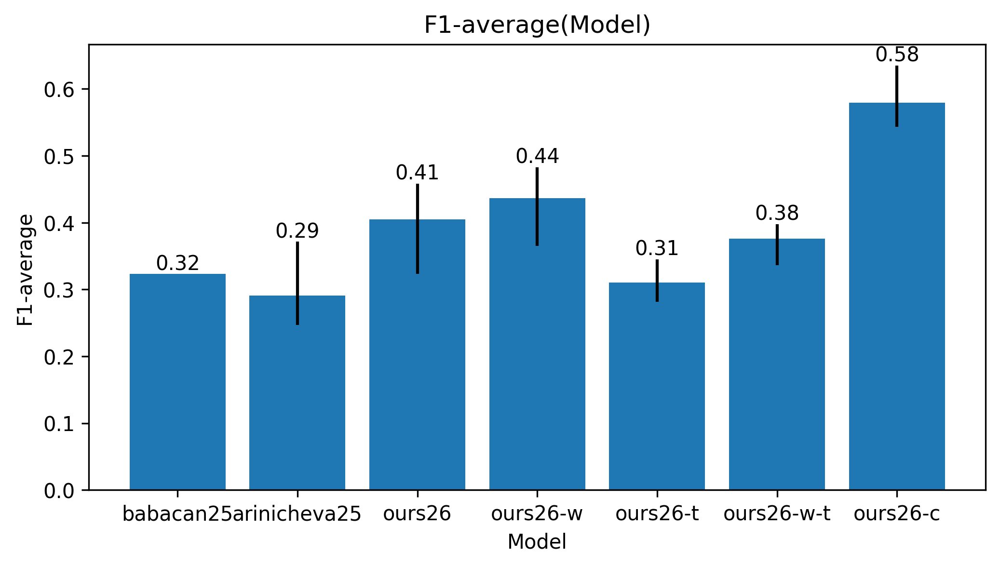

In [32]:
plot_bar_from_list_minmax('Model',
                          ['babacan25','arinicheva25','ours26','ours26-w','ours26-t','ours26-w-t','ours26-c'],
                          'F1-average',
                          [f1_babakan,summary_base[0][6],summary[0][6],summary_weighted[0][6],
                          summary_final[0][6],summary_final_weighted[0][6],summary_cleaned[0][6]],
                          minmax=[(f1_babakan,f1_babakan),(summary_base[0][4],summary_base[0][5]),
                                  (summary[0][4],summary[0][5]),(summary_weighted[0][4],summary_weighted[0][5]),
                                  (summary_final[0][4],summary_final[0][5]),
                                  (summary_final_weighted[0][4],summary_final_weighted[0][5]),
                                  (summary_cleaned[0][4],summary_cleaned[0][5])])

### Render per-distortion plots

In [33]:
labels = [l for l in labels if l != 'Distortion']
numbers_ours_wt = [round(results_base[0][0][5][l],2) for l in labels]
numbers_ours_wt

[0, 0.5, 0.46, 0.22, 0.31, 0, 0.39, 0.42, 0.57, 0.5]

In [34]:
# Visualize distiortion-specific F1 performances

metric_names = labels
model_metrics = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours26-w': numbers_ours,
'ours26-w-t': numbers_ours_wt
}
fig = go.Figure()
for i in range(len(labels)):
    fig.add_trace(go.Bar(
        name=metric_names[i],
        x=list(model_metrics), y=[model_metrics[m][i] for m in model_metrics],
    ))
fig.update_layout(
    barmode='group', # Group bars by model
    title='F1 by model and label', # Add a title
    xaxis_title='Model', # Label the x-axis
    yaxis_title='F1', # Label the y-axis
    hovermode='closest' # Improve hover behavior
)
fig.show()

babacan25 0.32
arinicheva25 0.22
ours26 0.48
ours26-w-t 0.34


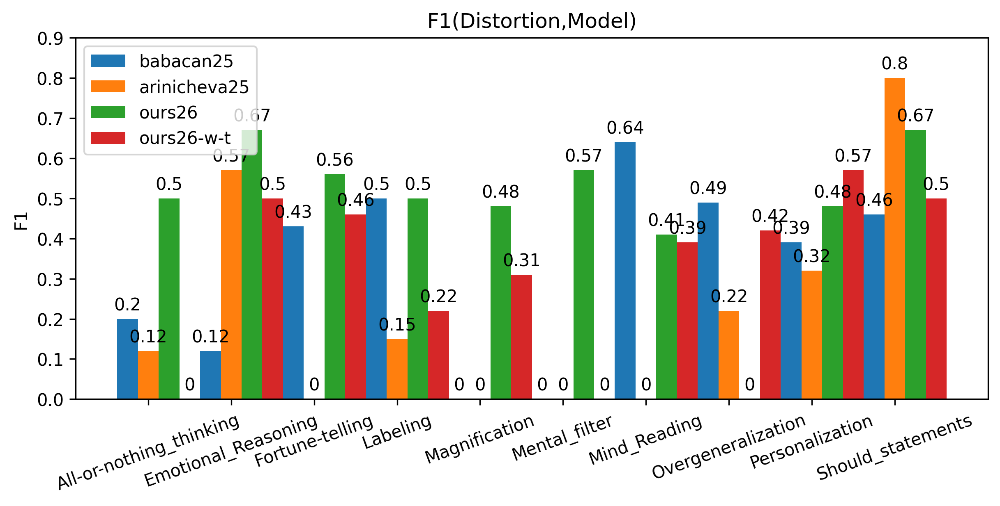

In [35]:
# Visualize distiortion-specific F1 performances

# Paper Figure 4

values = {
'babacan25':   numbers_babakan,
'arinicheva25':   numbers_arinicheva,
'ours26': numbers_ours,
'ours26-w-t': numbers_ours_wt
}

for v in values:
    numbers = values[v]
    print(v,round(sum(numbers)/len(numbers),2))

plt.rcParams["figure.figsize"] = (8,4)

x = np.arange(len(labels))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for attribute, measurement in values.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('F1')
ax.set_title('F1(Distortion,Model)')
ax.set_xticks(x + width, labels)
ax.legend(loc='upper left')#, ncols=3)
ax.set_ylim(0, 0.9)
ax.tick_params(axis='x', rotation=20)
fig.set_dpi(300)

plt.show()

In [36]:
# Evaluate the computing time budget

grand_t1 = dt.datetime.now()
grand_delta = grand_t1 - grand_t0
str(grand_delta)

'2:30:47.106960'